# Loading Data

In [1]:
from google.colab import files
uploads=files.upload()

Saving kaggle.json to kaggle.json


In [2]:
!ls -lha kaggle.json

-rw-r--r-- 1 root root 70 Nov 20 02:45 kaggle.json


In [0]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [0]:
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
!pip install kaggle

    100% |████████████████████████████████| 61kB 3.4MB/s 
    100% |████████████████████████████████| 245kB 7.2MB/s 
  Running setup.py bdist_wheel for kaggle ... - \ done
  Stored in directory: /root/.cache/pip/wheels/8b/21/3b/a0076243c6ae12a6215b2da515fe06b539aee7217b406e510e
  Running setup.py bdist_wheel for python-slugify ... - done
  Stored in directory: /root/.cache/pip/wheels/e3/65/da/2045deea3098ed7471eca0e2460cfbd3fdfe8c1d6fa6fcac92
Successfully built kaggle python-slugify


In [6]:
!kaggle datasets download -d snap/amazon-fine-food-reviews
#!kaggle competitions download -c tgs-salt-identification-challenge

 96% 240M/251M [00:02<00:00, 130MB/s]
100% 251M/251M [00:02<00:00, 99.7MB/s]


In [0]:
import zipfile
zip_ref = zipfile.ZipFile("amazon-fine-food-reviews.zip", 'r')
zip_ref.extractall("amazon")
zip_ref.close()

In [8]:
!pip install gensim

    100% |████████████████████████████████| 23.6MB 2.0MB/s 
    100% |████████████████████████████████| 1.4MB 15.1MB/s 
    100% |████████████████████████████████| 133kB 30.2MB/s 
    100% |████████████████████████████████| 61kB 23.1MB/s 
    100% |████████████████████████████████| 4.8MB 7.3MB/s 
    100% |████████████████████████████████| 552kB 28.8MB/s 
  Running setup.py bdist_wheel for smart-open ... - done
  Stored in directory: /root/.cache/pip/wheels/23/00/44/e5b939f7a80c04e32297dbd6d96fa3065af89ecf57e2b5f89f
  Running setup.py bdist_wheel for bz2file ... - done
  Stored in directory: /root/.cache/pip/wheels/81/75/d6/e1317bf09bf1af5a30befc2a007869fa6e1f516b8f7c591cb9
Successfully built smart-open bz2file


In [0]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3

import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle






#Data Preprocessing

In [0]:
con = sqlite3.connect('amazon/database.sqlite')

In [0]:
filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 """, con)

In [0]:
def partition(x):
    if x < 3:
        return 'negative'
    return 'positive'

In [0]:
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative

In [14]:
print(filtered_data.shape) #looking at the number of attributes and size of the data
filtered_data.head()

(525814, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,positive,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,negative,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,positive,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,negative,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,positive,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [15]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


In [0]:
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [17]:
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(364173, 10)

In [18]:
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

69.25890143662969

In [19]:

display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [0]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [21]:
final['Score'].value_counts()

positive    307061
negative     57110
Name: Score, dtype: int64

In [22]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [0]:
stop = set(stopwords.words('english'))
sno = nltk.stem.SnowballStemmer('english')

def cleanhtml(sentence): 
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext
def cleanpunc(sentence):
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned


In [0]:
final.sort_values(by='Time',inplace=True)

In [0]:
i=0
str1=' '
final_string=[]
all_positive_words=[]
all_negative_words=[]
s=''
for sent in final['Text'].values:
    filtered_sentence=[]
    
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if((cleaned_words.isalpha()) & (len(cleaned_words)>2)):    
                if(cleaned_words.lower() not in stop):
                    s=(sno.stem(cleaned_words.lower())).encode('utf8')
                    filtered_sentence.append(s)
                    if (final['Score'].values)[i] == 'positive': 
                        all_positive_words.append(s) 
                    if(final['Score'].values)[i] == 'negative':
                        all_negative_words.append(s) 
                else:
                    continue
            else:
                continue 
    str1 = b" ".join(filtered_sentence)
    
    
    final_string.append(str1)
    i+=1

In [0]:
final['CleanedText']=final_string 
final['CleanedText']=final['CleanedText'].str.decode("utf-8")

In [0]:
length=[]
for sent in final['Text']:
  length.append(len(sent))


In [0]:
final['len_text']=length

In [29]:
length[2]

166

In [30]:
len(final['Text'])

364171

In [31]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,CleanedText,len_text
138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,positive,939340800,EVERY book is educational,this witty little book makes my son laugh at l...,witti littl book make son laugh loud recit car...,375
138683,150501,0006641040,AJ46FKXOVC7NR,Nicholas A Mesiano,2,2,positive,940809600,This whole series is great way to spend time w...,I can remember seeing the show when it aired o...,rememb see show air televis year ago child sis...,407
417839,451856,B00004CXX9,AIUWLEQ1ADEG5,Elizabeth Medina,0,0,positive,944092800,Entertainingl Funny!,Beetlejuice is a well written movie ..... ever...,beetlejuic well written movi everyth excel act...,166
346055,374359,B00004CI84,A344SMIA5JECGM,Vincent P. Ross,1,2,positive,944438400,A modern day fairy tale,"A twist of rumplestiskin captured on film, sta...",twist rumplestiskin captur film star michael k...,222
417838,451855,B00004CXX9,AJH6LUC1UT1ON,The Phantom of the Opera,0,0,positive,946857600,FANTASTIC!,Beetlejuice is an excellent and funny movie. K...,beetlejuic excel funni movi keaton hilari wack...,244


In [32]:
X=final_data['CleanedText']
y=final_data['Score']
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=3)
for train_index, test_index in tscv.split(X):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

NameError: ignored

In [0]:
final_data=final.head(10**5)

In [34]:
final_data.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,CleanedText,len_text
138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,positive,939340800,EVERY book is educational,this witty little book makes my son laugh at l...,witti littl book make son laugh loud recit car...,375
138683,150501,0006641040,AJ46FKXOVC7NR,Nicholas A Mesiano,2,2,positive,940809600,This whole series is great way to spend time w...,I can remember seeing the show when it aired o...,rememb see show air televis year ago child sis...,407
417839,451856,B00004CXX9,AIUWLEQ1ADEG5,Elizabeth Medina,0,0,positive,944092800,Entertainingl Funny!,Beetlejuice is a well written movie ..... ever...,beetlejuic well written movi everyth excel act...,166
346055,374359,B00004CI84,A344SMIA5JECGM,Vincent P. Ross,1,2,positive,944438400,A modern day fairy tale,"A twist of rumplestiskin captured on film, sta...",twist rumplestiskin captur film star michael k...,222
417838,451855,B00004CXX9,AJH6LUC1UT1ON,The Phantom of the Opera,0,0,positive,946857600,FANTASTIC!,Beetlejuice is an excellent and funny movie. K...,beetlejuic excel funni movi keaton hilari wack...,244


In [0]:
train_data=final_data.head(60000)
#cv_data=final_data[60000:80000]
test_data=final_data[60000:100000]


In [36]:
train_data.shape

(60000, 12)

In [37]:
test_data.shape

(40000, 12)

In [0]:
def transform(x):
  if x=='positive':
    return 1
  else:
    return -1

In [0]:
y_=train_data['Score'].apply(transform)
y_test=test_data['Score'].apply(transform)
y_train=np.array(y_)
y_test=np.array(y_test)

In [40]:
y_.value_counts()

 1    53147
-1     6853
Name: Score, dtype: int64

In [41]:
a=53147
b=6853
print(a/(a+b))
print(b/(a+b))

0.8857833333333334
0.11421666666666666


# Bag of Words

In [0]:
count_vect = CountVectorizer()
bag_of_words = count_vect.fit_transform(train_data['CleanedText'].values)
print("the type of count vectorizer ",type(bag_of_words))
print("the shape of out text BOW vectorizer ",bag_of_words.get_shape())
print("the number of unique words ", bag_of_words.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (60000, 29132)
the number of unique words  29132


In [0]:
test_bag_of_words=count_vect.transform(test_data['CleanedText'])

In [0]:
X_train_1=bag_of_words
X_test_1=test_bag_of_words[20000:40000]
X_cv_1=test_bag_of_words[0:20000]

In [0]:
X_train_1.shape

(60000, 29132)

In [0]:
depths=[1,3,4,5,6,10,15,20,25,30]

In [0]:
accuracy=[]
f1score=[]
for i in depths:
    clf = DecisionTreeClassifier(max_depth=i, min_samples_split=20, min_samples_leaf=10)
    clf.fit(X_train_1,y_train)
    pred = clf.predict(X_cv_1)
    acc = accuracy_score(y_cv_3, pred, normalize=True) * float(100)
    f1 = f1_score(y_cv_3, pred)
    accuracy.append(acc)
    f1score.append(acc)

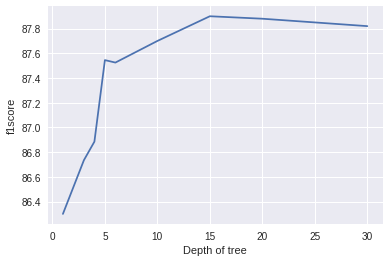

The best Depth for DecisionTreeClassifier is 6


In [0]:
plt.plot(depths,f1score)
plt.xlabel("Depth of tree")
plt.ylabel("f1score")
plt.show()
print("The best Depth for DecisionTreeClassifier is {}".format(np.array(f1score).argmax()))

In [0]:
Dtree = DecisionTreeClassifier(max_depth=6, min_samples_split=20, min_samples_leaf=10)
Dtree.fit(X_train_1,y_train)


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=6,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=10, min_samples_split=20,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [0]:
pred = Dtree.predict(X_test_1)
acc = accuracy_score(y_test_3, pred, normalize=True) * float(100)
f1 = f1_score(y_test_3, pred)
cm=confusion_matrix(y_test_3, pred)

In [0]:
print(acc)
print(f1)
print(cm)

87.96000000000001
0.93412846044425
[[  518  2160]
 [  248 17074]]


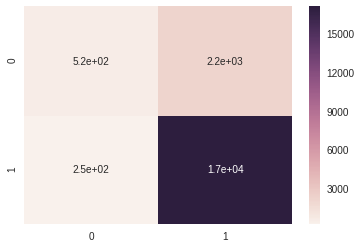

In [0]:
sns.heatmap(cm,annot=True)

import

In [0]:
len(clf.feature_importances_)

29132

In [0]:
clf.feature_importances_

array([0.02666667, 0.        , 0.05072262, 0.92261071])

In [0]:
!pip install graphviz

In [0]:
importent_features=(clf.feature_importances_).argsort()

In [0]:
importent_features=np.take(count_vect.get_feature_names(),importent_features[-20:])

In [0]:
print(importent_features)

['sorri' 'money' 'perfect' 'refund' 'would' 'threw' 'delici' 'tast' 'aw'
 'good' 'return' 'horribl' 'terribl' 'love' 'bad' 'wast' 'best' 'great'
 'worst' 'disappoint']


In [0]:
from IPython.display import Image, display
tree.export_graphviz(Dtree,out_file='bag.dot',feature_names=count_vect.get_feature_names())
display(Image('bow1.png'))

#TF-IDF

In [42]:
tf_idf_vect = TfidfVectorizer()
final_tf_idf = tf_idf_vect.fit_transform(train_data['CleanedText'].values)
print("the type of count vectorizer ",type(final_tf_idf))
print("the shape of out text TFIDF vectorizer ",final_tf_idf.get_shape())
print("the number of unique words including both unigrams and bigrams ", final_tf_idf.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text TFIDF vectorizer  (60000, 29132)
the number of unique words including both unigrams and bigrams  29132


In [43]:
test_final_tf_idf=tf_idf_vect.transform(test_data['CleanedText'])

test_final_tf_idf.get_shape()

(40000, 29132)

In [0]:
X_train_2=final_tf_idf
X_test_2=test_final_tf_idf[20000:40000]
X_cv_2=test_final_tf_idf[0:20000]

In [0]:
accuracy=[]
f1score=[]
for i in depths:
    clf = DecisionTreeClassifier(max_depth=i, min_samples_split=20, min_samples_leaf=10)
    clf.fit(X_train_2,y_train)
    pred = clf.predict(X_cv_2)
    acc = accuracy_score(y_cv_3, pred, normalize=True) * float(100)
    f1 = f1_score(y_cv_3, pred)
    accuracy.append(acc)
    f1score.append(acc)


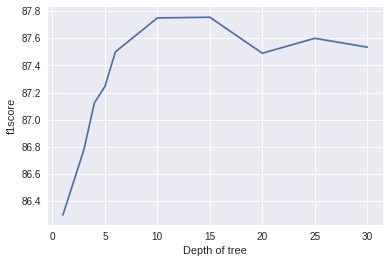

The best Depth for DecisionTreeClassifier is 6


In [52]:
plt.plot(depths,f1score)
plt.xlabel("Depth of tree")
plt.ylabel("f1score")
plt.show()
print("The best Depth for DecisionTreeClassifier is {}".format(np.array(f1score).argmax()))


In [53]:
Dtree = DecisionTreeClassifier(max_depth=6, min_samples_split=20, min_samples_leaf=10)
Dtree.fit(X_train_2,y_train)


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=6,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=10, min_samples_split=20,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [54]:

pred = Dtree.predict(X_test_2)
acc = accuracy_score(y_test_3, pred, normalize=True) * float(100)
f1 = f1_score(y_test_3, pred)
cm=confusion_matrix(y_test_3, pred)
print(acc)
print(f1)
print(cm)

87.665
0.9324978794429092
[[  493  2185]
 [  282 17040]]


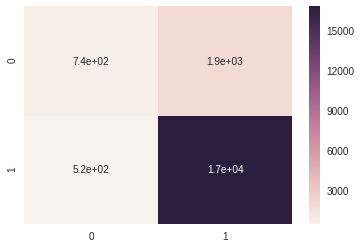

In [0]:
sns.heatmap(cm,annot=True)

In [0]:
from sklearn import tree

In [0]:
>>> tree.export_graphviz(Dtree,
...     out_file='tfidf.dot',feature_names=tf_idf_vect.get_feature_names())

In [0]:
from IPython.display import Image, display

In [0]:
display(Image('tfidf.png'))

In [0]:
len(tree.feature_importances_)

29132

In [0]:
importent_features=(tree.feature_importances_).argsort()

In [0]:
importent_features=np.take(count_vect.get_feature_names(),importent_features[-20:])

In [0]:
print(importent_features)

['howev' 'much' 'ive' 'review' 'ever' 'thought' 'wont' 'horribl' 'terribl'
 'perfect' 'delici' 'tast' 'best' 'money' 'return' 'bad' 'wast' 'great'
 'worst' 'disappoint']


# Word to Vec

In [0]:
i=0
list_of_sent=[]
for sent in train_data['CleanedText'].values:
    list_of_sent.append(sent.split())

In [56]:
len(list_of_sent)

60000

In [0]:
w2v_model=Word2Vec(list_of_sent,min_count=5,size=50, workers=4)

In [58]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  9957
sample words  ['witti', 'littl', 'book', 'make', 'son', 'laugh', 'loud', 'car', 'drive', 'along', 'alway', 'sing', 'refrain', 'hes', 'learn', 'whale', 'india', 'droop', 'love', 'new', 'word', 'introduc', 'silli', 'classic', 'will', 'bet', 'still', 'abl', 'memori', 'colleg', 'rememb', 'see', 'show', 'air', 'televis', 'year', 'ago', 'child', 'sister', 'later', 'bought', 'day', 'thirti', 'someth', 'use', 'seri', 'song', 'student', 'teach', 'preschool']


# AVG WORD2VEC

In [0]:
sent_vectors = []
for sent in list_of_sent:
    sent_vec = np.zeros(50) 
    cnt_words =0; 
    for word in sent: 
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)


In [0]:
test_list_of_sent=[]
for sent in test_data['CleanedText'].values:
    test_list_of_sent.append(sent.split())

In [0]:
test_sent_vectors = []
for sent in test_list_of_sent:
    sent_vec = np.zeros(50) 
    cnt_words =0; 
    for word in sent: 
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    test_sent_vectors.append(sent_vec)

In [62]:
len(test_sent_vectors)

40000

In [0]:
y_cv_3=y_test[0:20000]
y_test_3=y_test[20000:40000]

In [0]:
X_cv_3=np.array(test_sent_vectors[0:20000])
X_test_3=np.array(test_sent_vectors[20000:40000])
X_train_3=np.array(sent_vectors)

In [0]:
y_.value_counts()

 1    53147
-1     6853
Name: Score, dtype: int64

In [0]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn import metrics


In [0]:
depths=[1,3,5,10,15,20,25,30,35,40,45,50]

In [0]:
accuracy=[]
f1score=[]
for i in depths:
    clf = DecisionTreeClassifier(max_depth=i, min_samples_split=20, min_samples_leaf=10)
    clf.fit(X_train_3,y_train)
    pred = clf.predict(X_cv_3)
    acc = accuracy_score(y_cv_3, pred, normalize=True) * float(100)
    f1 = f1_score(y_cv_3, pred)
    accuracy.append(acc)
    f1score.append(acc)


In [0]:
Error=[100-x for x in accuracy]

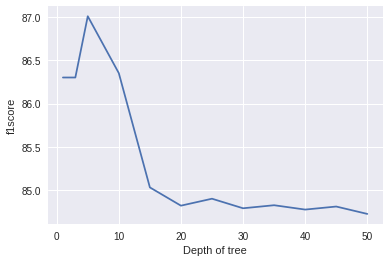

In [73]:

plt.plot(depths,f1score)
plt.xlabel("Depth of tree")
plt.ylabel("f1score")
plt.show()



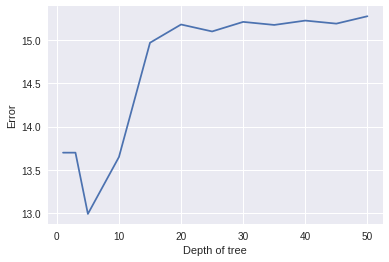

In [74]:
plt.plot(depths,Error)
plt.xlabel("Depth of tree")
plt.ylabel("Error")
plt.show()


In [0]:

Dtree = DecisionTreeClassifier(max_depth=20, min_samples_split=20, min_samples_leaf=10)

In [81]:

Dtree.fit(X_train_3,y_train)


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=20,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=10, min_samples_split=20,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [0]:
from sklearn.metrics import confusion_matrix

In [0]:
pred = Dtree.predict(X_test_3)
acc = accuracy_score(y_test_3, pred, normalize=True) * float(100)
f1 = f1_score(y_test_3, pred)
cm=confusion_matrix(y_test_3, pred)

In [84]:
print(acc)
print(f1)
print(cm)

84.69
0.912619142742994
[[  948  1730]
 [ 1332 15990]]


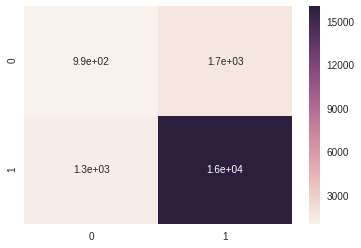

In [0]:
sns.heatmap(cm,annot=True)

In [0]:
from sklearn import tree
tree.export_graphviz(clf,out_file='avgW2v1.dot')

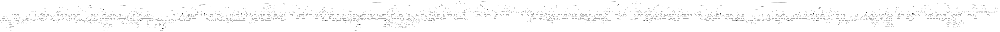

In [89]:
display(Image('avg.png'))

# TF-IDF Word2Vec

In [0]:
tfidf_feat = tf_idf_vect.get_feature_names()

In [0]:
tfidf_sent_vectors = []
row=0;
for sent in list_of_sent 
    sent_vec = np.zeros(50)
    weight_sum =0
    for word in sent: 
        if word in w2v_words:
            vec = w2v_model.wv[word]
           
            tf_idf = final_tf_idf[row, tfidf_feat.index(word)]
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1

**Tranforming Test Data**

In [0]:
test_tfidf_sent_vectors = []
row=0;
for sent in list_of_sent 
    sent_vec = np.zeros(50)
    weight_sum =0
    for word in sent: 
        if word in w2v_words:
            vec = w2v_model.wv[word]
           
            tf_idf = test_final_tf_idf[row, tfidf_feat.index(word)]
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf

    if weight_sum != 0:
        sent_vec /= weight_sum
    test_tfidf_sent_vectors.append(sent_vec)
    row += 1

In [102]:
uploads=files.upload()

Saving tfidf_sent to tfidf_sent


In [0]:
df1=pd.read_pickle("tfidf_sent")
df2=pd.read_pickle("cv_tfidf_sent_vectors")
df3=pd.read_pickle("test_tfidf_sent_vectors")


In [0]:
X_cv_4=np.array(test_tfidf_vectors[0:20000])
X_test_4=np.array(test_tfidf_vectors[20000:40000])
X_train_4=np.array(tfidf_vectors)

In [0]:
X_train_4=np.array(df1)
X_cv_4=np.array(df2)
X_test_4=np.array(df3)

In [0]:
y_cv_4=y_test[0:20000]
y_test_4=y_test[20000:40000]

In [0]:
accuracy=[]
f1score=[]
for i in depths:
    clf = DecisionTreeClassifier(max_depth=i, min_samples_split=20, min_samples_leaf=10)
    clf.fit(X_train_4,y_train)
    pred = clf.predict(X_cv_4)
    acc = accuracy_score(y_cv_4, pred, normalize=True) * float(100)
    f1 = f1_score(y_cv_4, pred)
    accuracy.append(acc)
    f1score.append(acc)


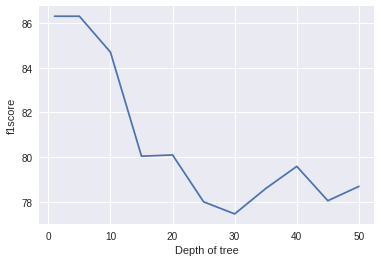

In [109]:
plt.plot(depths,f1score)
plt.xlabel("Depth of tree")
plt.ylabel("f1score")
plt.show()

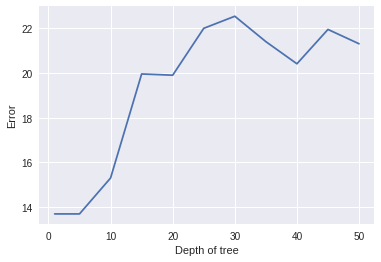

The best Depth for DecisionTreeClassifier is 30


In [116]:
Error=[100-x for x in accuracy]
plt.plot(depths,Error)
plt.xlabel("Depth of tree")
plt.ylabel("Error")
plt.show()
print("The best Depth for DecisionTreeClassifier is {}".format(30))

In [0]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import auc
from sklearn.metrics import f1_score

In [0]:
Dtree = DecisionTreeClassifier(max_depth=30, min_samples_split=20, min_samples_leaf=10)
Dtree.fit(X_train_4,y_train)
pred = Dtree.predict(X_test_4)

In [0]:
acc = accuracy_score(y_test_4, pred, normalize=True) * float(100)
f1 = f1_score(y_test_4, pred)
cm=confusion_matrix(y_test_4, pred)

In [114]:
print(acc)
print(f1)
print(cm)

81.72
0.8963953751983678
[[  528  2150]
 [ 1506 15816]]


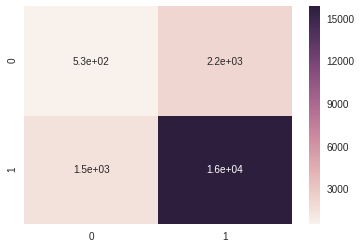

In [115]:
sns.heatmap(cm,annot=True)

In [0]:
from sklearn import tree

In [0]:
tree.export_graphviz(Dtree,out_file='tfW2v.dot')

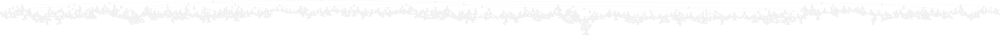

In [124]:
display(Image('tfavg.png'))

#Conclusion

In [125]:
!pip install prettytable
from prettytable import PrettyTable

  Running setup.py bdist_wheel for prettytable ... - done
  Stored in directory: /root/.cache/pip/wheels/80/34/1c/3967380d9676d162cb59513bd9dc862d0584e045a162095606
Successfully built prettytable


In [126]:
x = PrettyTable()

x.field_names = ["Model", "Depth","Train ACC( F1_score)", "Test ACC"]

x.add_row(["Bag of words",6,87.6, 87.4])
x.add_row(["TF_IDF",11 ,88.07, 88.1])
x.add_row(["AVG-W2VEC",20,89.23, 88.38])
x.add_row([" Weighted TF_IDF",30,83.76, 81.33])
print(x)

+------------------+-------+----------------------+----------+
|      Model       | Depth | Train ACC( F1_score) | Test ACC |
+------------------+-------+----------------------+----------+
|   Bag of words   |   6   |         87.6         |   87.4   |
|      TF_IDF      |   11  |        88.07         |   88.1   |
|    AVG-W2VEC     |   20  |        89.23         |  88.38   |
|  Weighted TF_IDF |   30  |        83.76         |  81.33   |
+------------------+-------+----------------------+----------+
